Objetive is to detect face mask

 Extracting the dataset from a zip file

In [58]:
from zipfile import ZipFile
dataset='archive.zip'

zip=ZipFile(dataset,'r')
zip.extractall()




Step 1: Importing required libraries

In [59]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split

spliting the dataset into with mask and without mask

In [60]:
with_mask_files=os.listdir('data\with_mask')
print(with_mask_files[0:5])


without_mask_files=os.listdir('data\without_mask')
print(without_mask_files[0:5])

['with_mask_1.jpg', 'with_mask_10.jpg', 'with_mask_100.jpg', 'with_mask_1000.jpg', 'with_mask_1001.jpg']
['without_mask_1.jpg', 'without_mask_10.jpg', 'without_mask_100.jpg', 'without_mask_1000.jpg', 'without_mask_1001.jpg']


In [61]:
#counting the elements in both data

print("Number of with mask images:",len(with_mask_files))
print("Number of without mask images:",len(without_mask_files))

Number of with mask images: 3725
Number of without mask images: 3828


In [62]:
#creating the labels for the two class of images

'''with mask -> 1       
   without mask -> 0'''


with_mask_labels=[1]*3725

without_mask_labels=[0]*3828

In [63]:
print(with_mask_labels[0:5])
print(without_mask_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [64]:
labels=with_mask_labels+without_mask_labels   #combined both the labels


print(len(labels))

7553


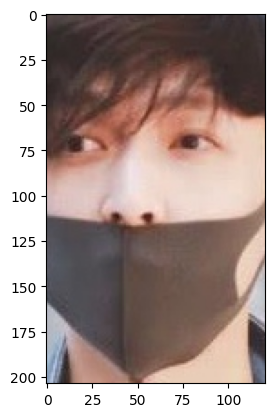

In [65]:
#displaying the images

#displaying  one image with mask 
img=mpimg.imread('data\with_mask/with_mask_1001.jpg')
imgplot= plt.imshow(img)
plt.show()

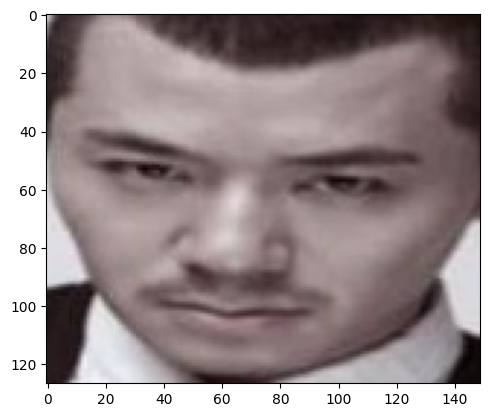

In [66]:
#displaying  one image without mask 
img=mpimg.imread('data\without_mask/without_mask_100.jpg')
imgplot= plt.imshow(img)
plt.show()

Step 2  : Image Processing

        1. resizing the images
        2. converting images to numpy arrays

In [67]:
#converting images to numpy arrays
with_mask_path = 'data\with_mask/'

data=[]

for img_file in with_mask_files:

        image=Image.open(with_mask_path + img_file)
        image=image.resize((128,128))
        image=image.convert('RGB')
        image=np.array(image)
        data.append(image)




without_mask_path = 'data\without_mask/'



for img_file in without_mask_files:

        image=Image.open(without_mask_path + img_file)
        image=image.resize((128,128))
        image=image.convert('RGB')
        image=np.array(image)
        data.append(image)

c:\Users\bisht\anaconda3\envs\Dlprojects\lib\site-packages\PIL\Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [68]:
print(type(data))
print(len(data))

<class 'list'>
7553


In [69]:
print(data)

[array([[[50, 58, 31],
        [46, 55, 33],
        [56, 58, 42],
        ...,
        [27, 32, 25],
        [29, 33, 19],
        [33, 40, 17]],

       [[47, 54, 30],
        [49, 58, 36],
        [59, 63, 40],
        ...,
        [18, 21, 11],
        [37, 42, 31],
        [31, 41, 23]],

       [[51, 58, 37],
        [50, 59, 37],
        [59, 64, 37],
        ...,
        [45, 44, 30],
        [29, 34, 27],
        [20, 30, 18]],

       ...,

       [[63, 73, 37],
        [66, 75, 41],
        [74, 84, 50],
        ...,
        [ 5,  3,  0],
        [20, 19, 14],
        [17, 16, 12]],

       [[58, 72, 34],
        [60, 70, 39],
        [68, 75, 49],
        ...,
        [16, 15, 12],
        [15, 13, 10],
        [13,  9,  7]],

       [[53, 69, 30],
        [53, 64, 37],
        [57, 64, 42],
        ...,
        [18, 18, 16],
        [16, 13, 12],
        [19, 12, 13]]], dtype=uint8), array([[[117,  61,  15],
        [121,  65,  17],
        [129,  73,  23],
        ...,
  

In [70]:
print(type(data[0]))

print(data[0].shape)

<class 'numpy.ndarray'>
(128, 128, 3)


In [71]:
#converting image list and label list to numpy array

x=np.array(data)
y=np.array(labels)


print(type(x))
print(x.shape)
print(type(y))
print(y.shape)

<class 'numpy.ndarray'>
(7553, 128, 128, 3)
<class 'numpy.ndarray'>
(7553,)


Step 3 : Spliting data into test train

In [72]:
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.2, random_state=42)

In [73]:
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(6042, 128, 128, 3) (1511, 128, 128, 3) (6042,) (1511,)


In [74]:
#scaling the data 

x_train_scaled= x_train/255

x_test_scaled= x_test/255

Step 4 : Building the CNN

In [75]:
import tensorflow as tf
from tensorflow import keras

num_of_classes=2
model=keras.Sequential([
        keras.layers.Conv2D(32, kernel_size=(3,3) , activation='relu', input_shape=(128,128,3)), #convolutional layer
        keras.layers.MaxPooling2D(pool_size=(2,2)), #maxpooling layer
        keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu') ,
        keras.layers.MaxPooling2D(pool_size=(2,2)),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(num_of_classes, activation='sigmoid')
])

#compileing the neural network
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#training the neural network

history=model.fit(x_train_scaled,y_train, validation_split=0.1,epochs=10)


#evaluating the neural network

loss,accuracy=model.evaluate(x_test_scaled,y_test)

print(" Test accuracy = ",accuracy)

c:\Users\bisht\anaconda3\envs\Dlprojects\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 57s 309ms/step - accuracy: 0.7137 - loss: 0.6250 - val_accuracy: 0.9223 - val_loss: 0.2554
Epoch 2/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 81s 305ms/step - accuracy: 0.8791 - loss: 0.3024 - val_accuracy: 0.9256 - val_loss: 0.1665
Epoch 3/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 82s 306ms/step - accuracy: 0.9132 - loss: 0.2322 - val_accuracy: 0.9174 - val_loss: 0.1775
Epoch 4/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 52s 306ms/step - accuracy: 0.9168 - loss: 0.2034 - val_accuracy: 0.9372 - val_loss: 0.1657
Epoch 5/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 81s 301ms/step - accuracy: 0.9292 - loss: 0.1728 - val_accuracy: 0.9306 - val_loss: 0.1564
Epoch 6/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 82s 299ms/step - accuracy: 0.9361 - loss: 0.1602 - val_accuracy: 0.9438 - val_loss: 0.1609
Epoch 7/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 51s 299ms/step - accuracy: 0.9585 - loss: 0.1104 - val_accuracy: 0.9521 - val_loss: 0.1486
Epoch 8/10
170/170 ━━━━━━━━━━━━━━━━━━━━ 51s 297ms/step - accuracy: 0.9554 - loss: 0

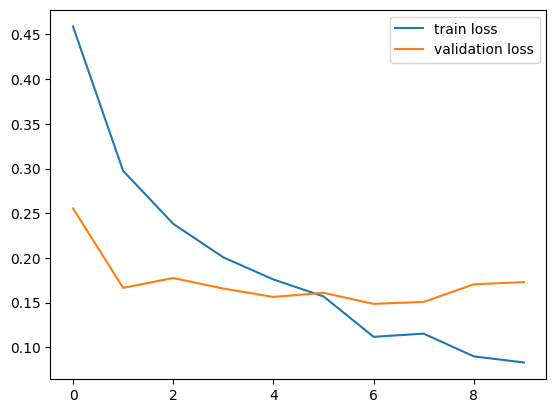

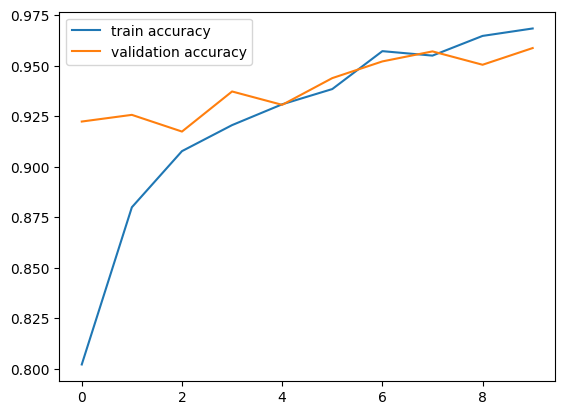

In [76]:
h=history

#ploting the loss value 
plt.plot(h.history['loss'],label='train loss')
plt.plot(h.history['val_loss'],label='validation loss')
plt.legend()
plt.show()


#ploting the accuracy value
plt.plot(h.history['accuracy'],label='train accuracy')
plt.plot(h.history['val_accuracy'],label='validation accuracy')
plt.legend()
plt.show()


Predictive system

In [80]:
input_image_path=input(" Enter Path of the image: ")

input_image=cv2.imread(input_image_path)
cv2.imshow("input image",input_image)

input_image_resized=cv2.resize(input_image,(128,128))

input_image_scaled=input_image_resized/255.0

input_image_reshaped=np.reshape(input_image_scaled,(1,128,128,3))

input_pred=model.predict(input_image_reshaped)

print(input_pred)

input_pred_label=np.argmax(input_pred)

if(input_pred_label==0):
        print("Image does not have mask")
else:
        print("Image contains mask")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
[[0.38525617 0.24835807]]
Image does not have mask


In [ ]:
import joblib

joblib.dump(model, 'face_mask_classifier.pkl')

['face_mask_classifier.pkl']

: 